# Medical Imaging Coursework 25/26

*Harvey Bermingham*

### Development and Testing Notebook

The notebook below is used to for the testing and development of scripts, this is NOT my response to the questions however, that is included in the report.

## Module 1

### Excercise 1.1 (a)

In [64]:
%load_ext autoreload
%autoreload 2

from med_im import module_1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Image shape: (512, 512)
Min value: 0.0
Max value: 0.001


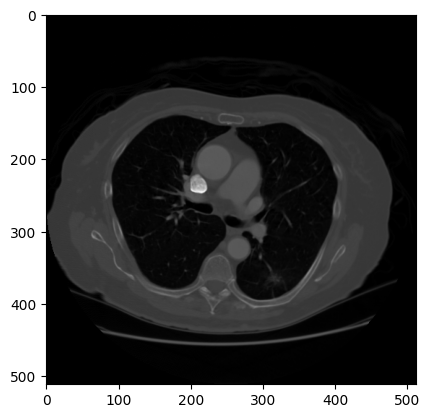

In [65]:
image = module_1.image_outputs()


### Excercise 1.1 (b)

SimulateGaussian(𝜇= 0, 𝜎= 0.05) and Poisson noise atthree different levels (𝐼0 ∈ [105,103,102]). Simulate these sinograms at different total number of angles, 360, 90, 20.

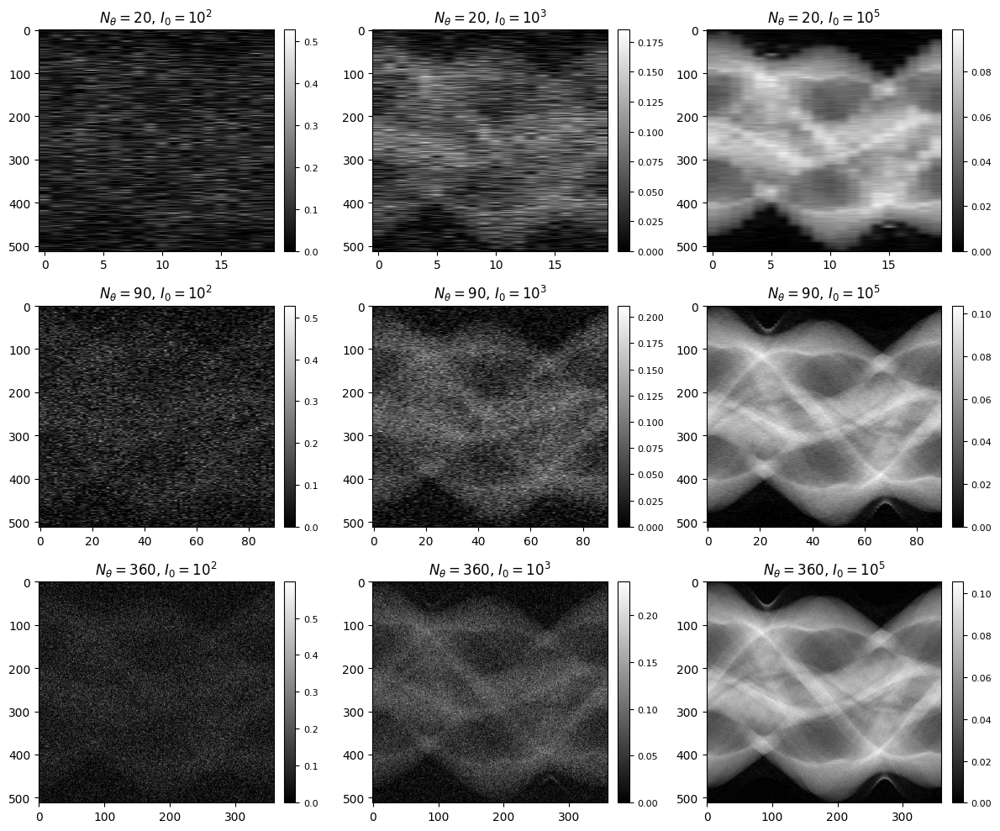

In [76]:
noisy_sinogram_dict = module_1.create_noisy_sinograms(image)
module_1.plot_sinogram_dict(noisy_sinogram_dict)

### Excercise 1.1 (c)

Reconstruct all sinograms,first with FBP, and then Gradient Descent. What is the performance? When do they do better or worse? Display reconstruction error and image quality metrics and do a comparative analysis. What does eachs canning procedure and algorithmmean in clinical practice for the patients? what are their impact?

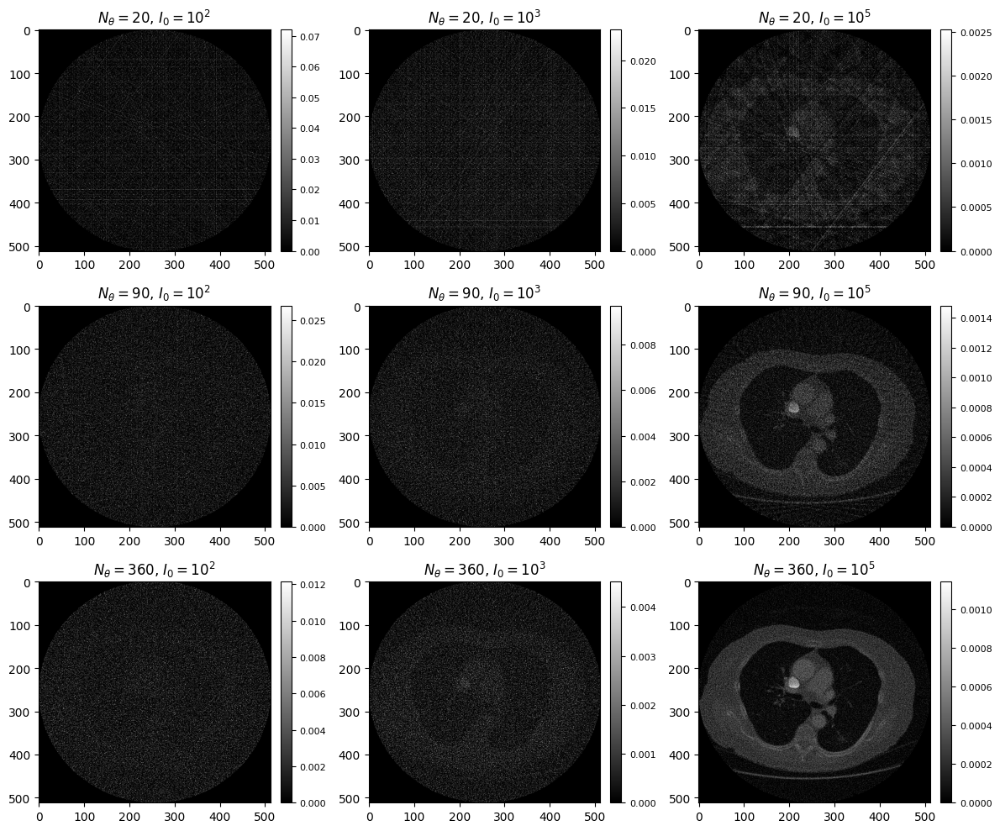

In [77]:
FBP_backprojection_dict = module_1.FBP_backprojection(noisy_sinogram_dict)
module_1.plot_sinogram_dict(FBP_backprojection_dict)

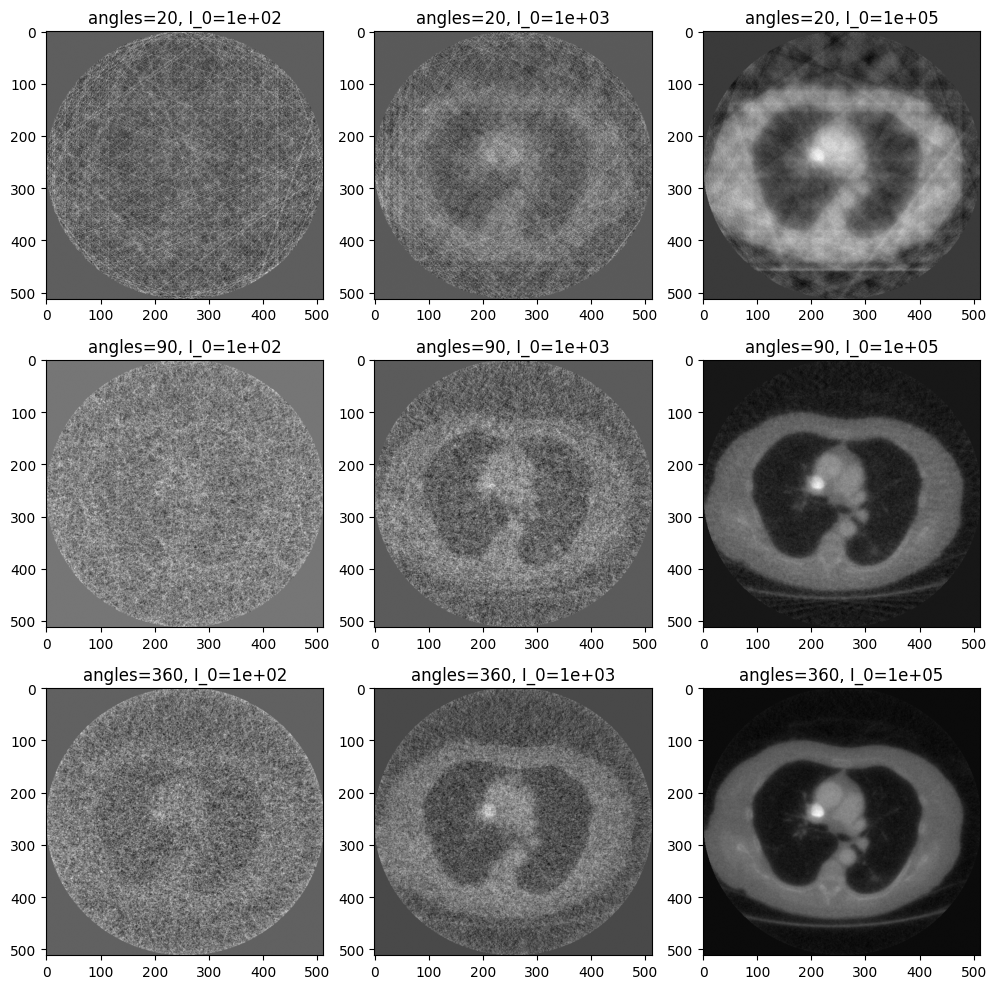

In [70]:
GD_backprojection_dict = module_1.GD_backprojection(noisy_sinogram_dict)
module_1.plot_sinogram_dict(GD_backprojection_dict)

### Excercise 1.2 (a)

Sometimesduetomeasurementconstraints(e.g. arobotarminimageguidedsurgery)or
forscannerdesign(e.g. DigitalBreast Tomosynthesis).

Simulatenoisysinogramsat threedifferent angular ranges,180, 120, 40

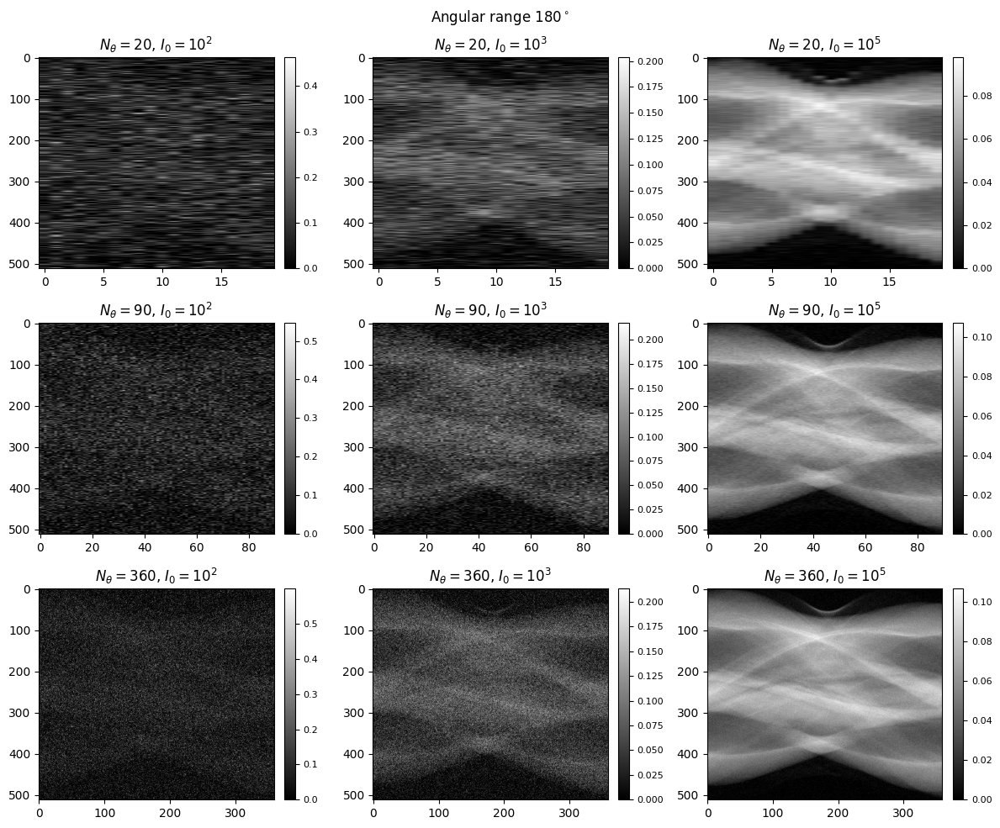

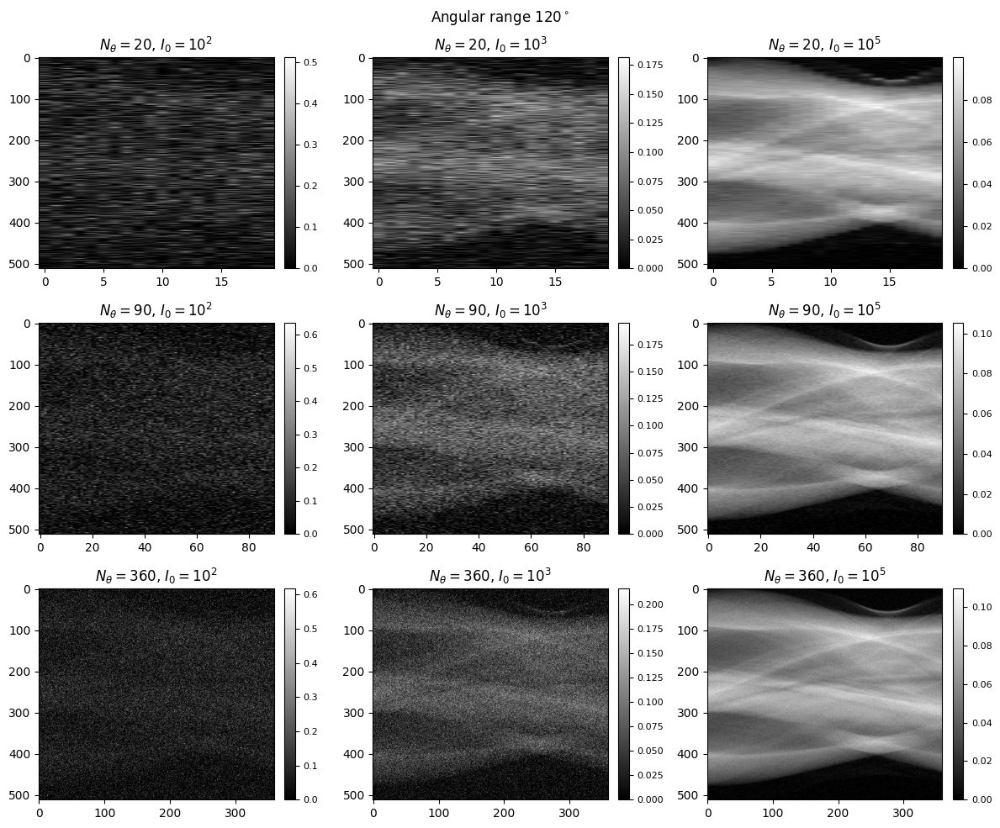

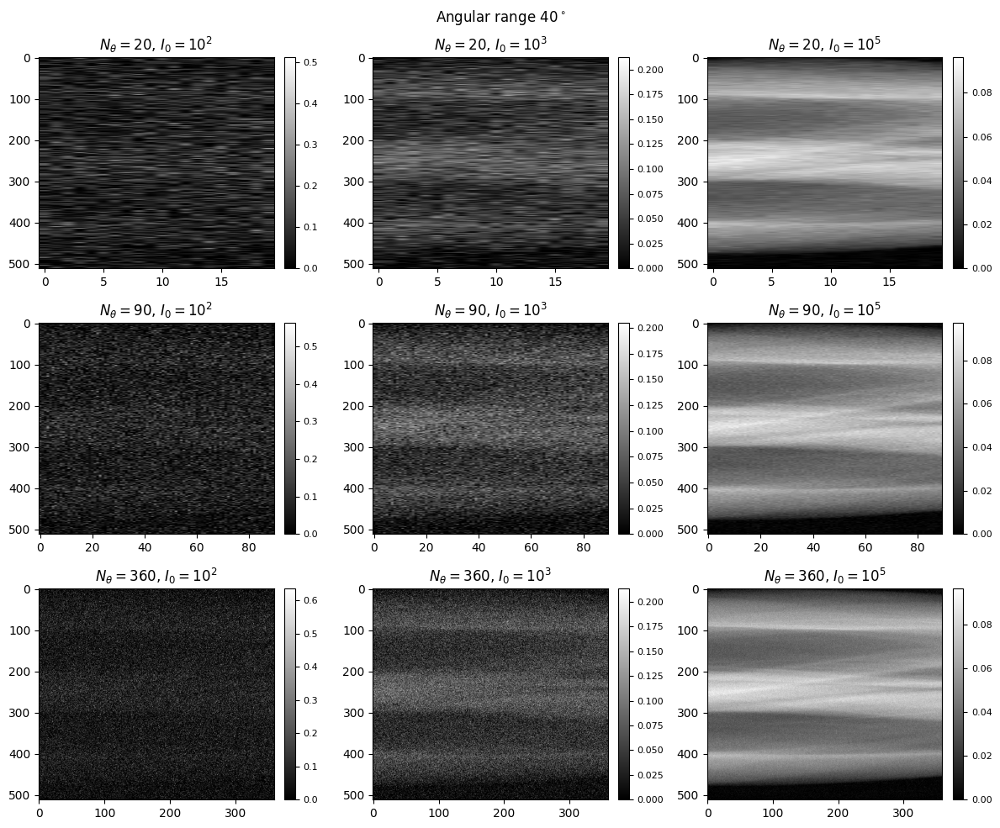

In [79]:
# 1.2a: noisy sinograms at three angular ranges 180°, 120°, 40°
for angle_range in [180, 120, 40]:
    limited_sinogram_dict = module_1.create_noisy_sinograms(image, angle_range=angle_range)
    module_1.plot_sinogram_dict(limited_sinogram_dict, suptitle=r'Angular range ${}^\circ$'.format(angle_range))

### Excercise 1.2 (b)

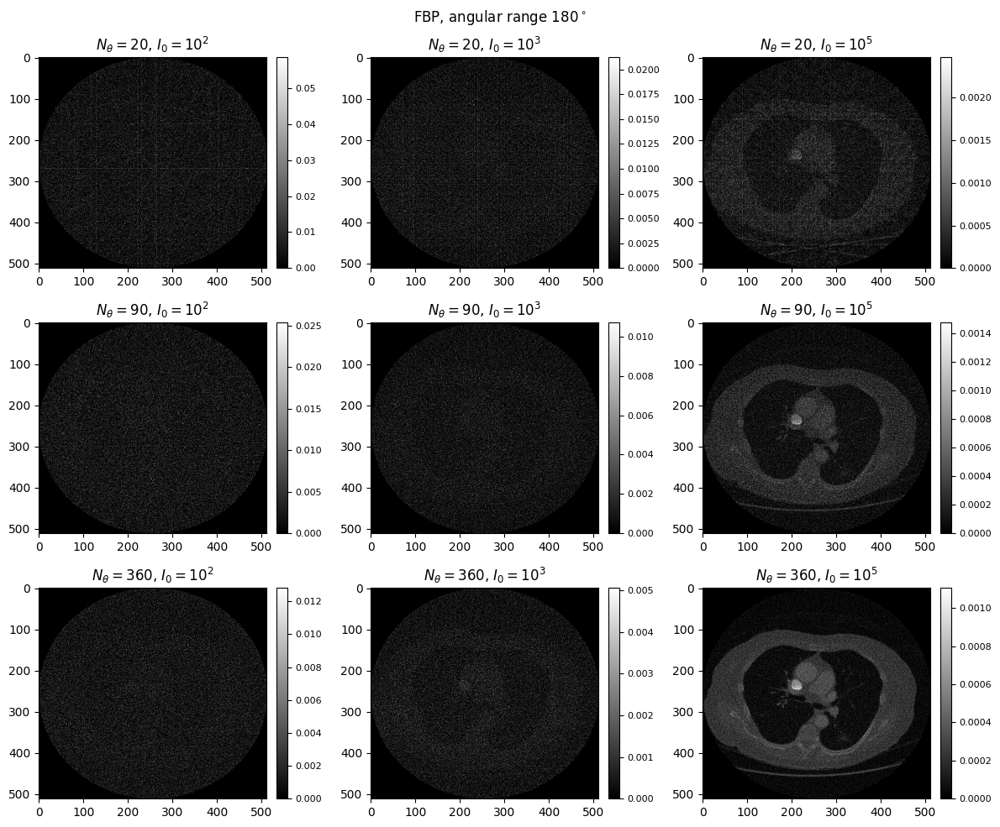

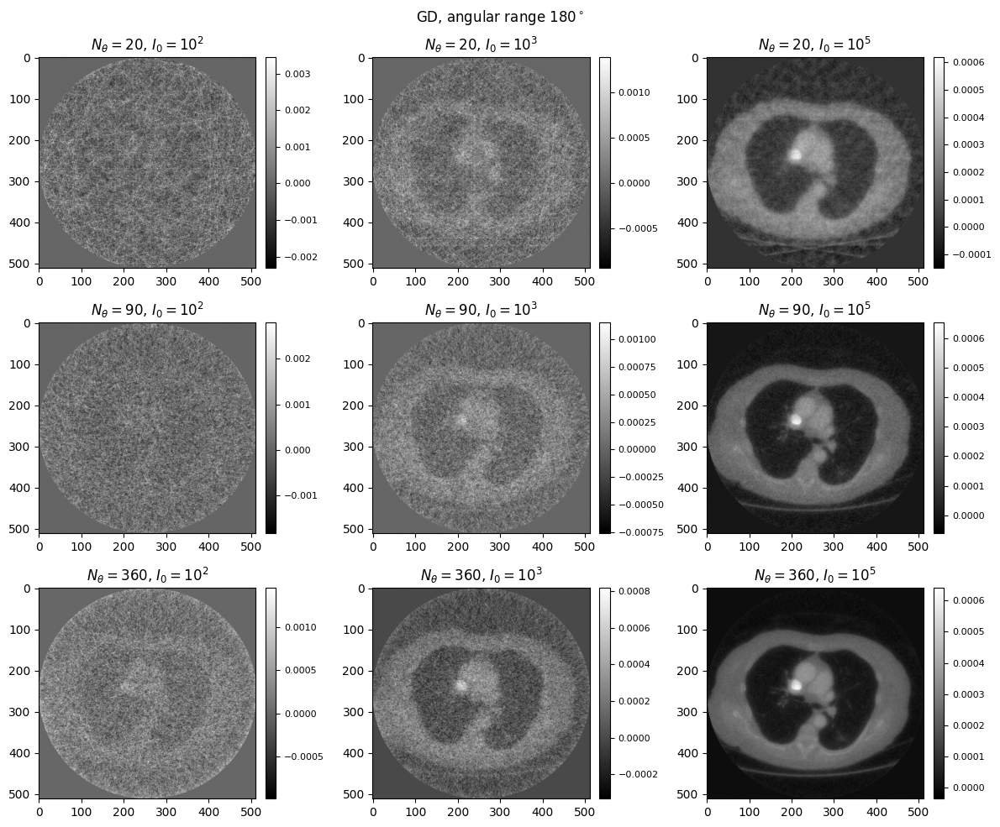

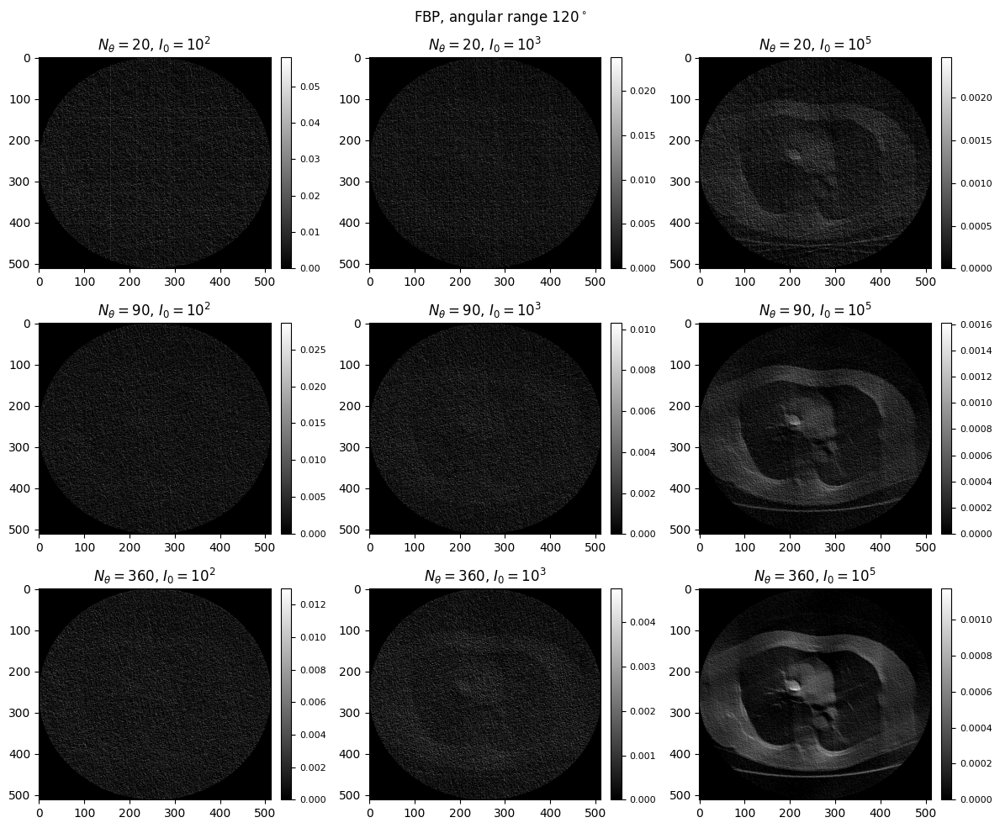

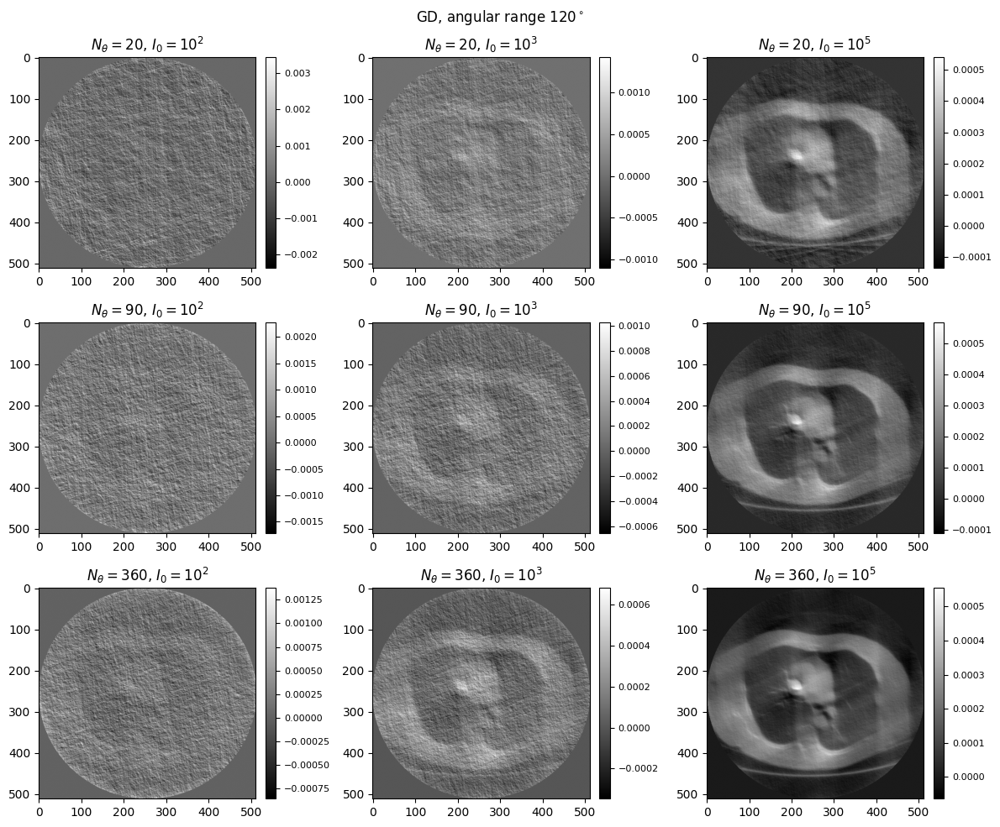

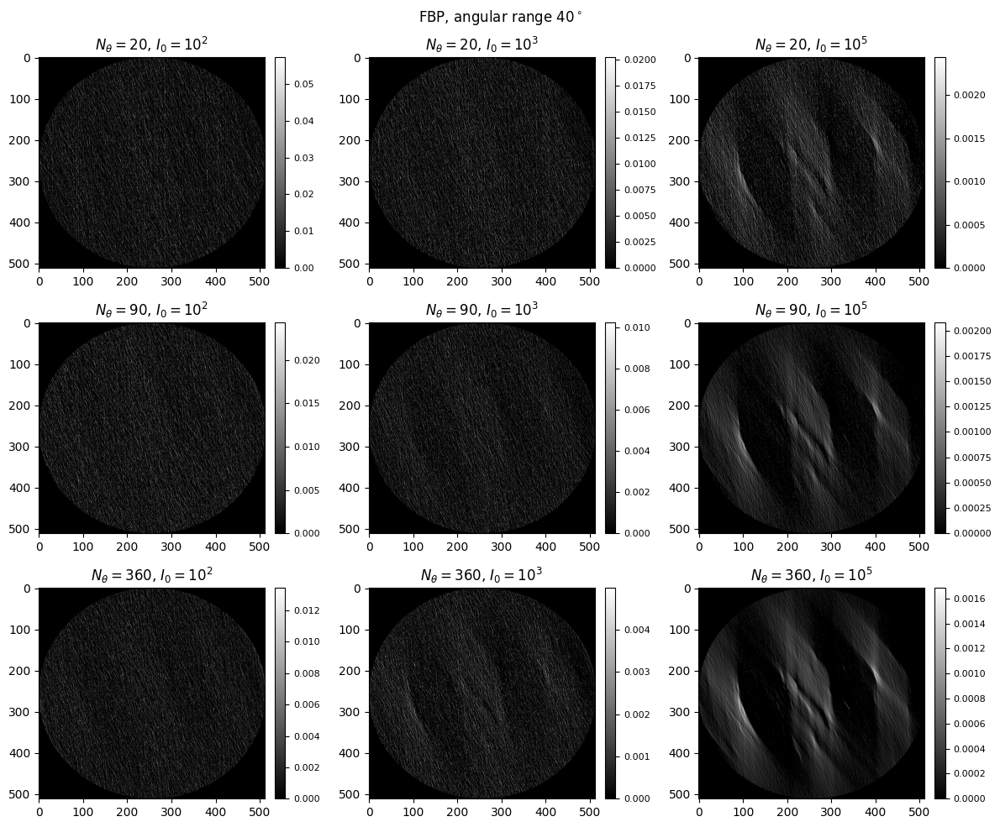

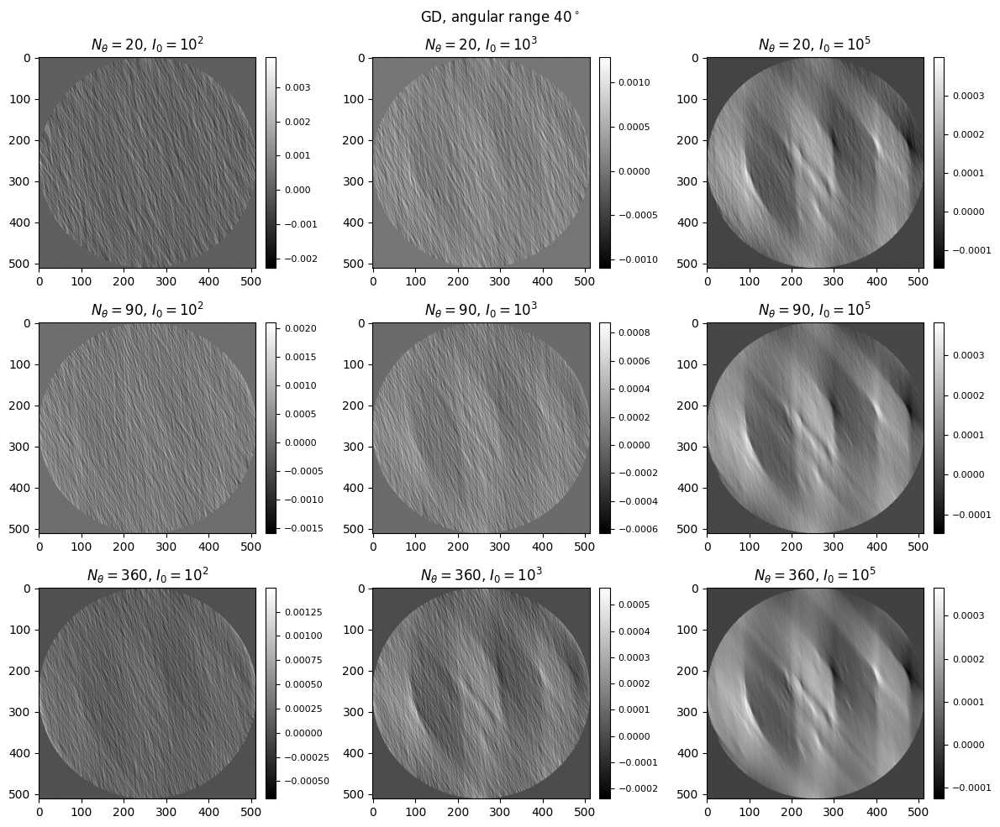

In [80]:
# Repeat 1.1 experiment for each limited angle range: FBP and GD reconstructions
for angle_range in [180, 120, 40]:
    limited_sinogram_dict = module_1.create_noisy_sinograms(image, angle_range=angle_range)
    FBP_limited = module_1.FBP_backprojection(limited_sinogram_dict, angle_range=angle_range)
    module_1.plot_sinogram_dict(FBP_limited, suptitle=r'FBP, angular range ${}^\circ$'.format(angle_range))
    GD_limited = module_1.GD_backprojection(limited_sinogram_dict, angle_range=angle_range)
    module_1.plot_sinogram_dict(GD_limited, suptitle=r'GD, angular range ${}^\circ$'.format(angle_range))

### Excercise 1.3 (a)

Shepp–Logan: ramp multiplied by a sinc window. This slightly rolls off high frequencies, reducing noise compared to pure Ram–Lak while keeping reasonably sharp edges.
Cosine: ramp multiplied by a cosine window. This more strongly suppresses high frequencies, giving smoother (less noisy) but more blurred reconstructions.

In [82]:
angles, I0 = 20, 1e2  # choose a low-dose example
module_1.FBP_compare_filters(noisy_sinogram_dict, angles=angles, I0=I0)

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices